In [41]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 1. load base image, gray scale, and normalize

In [137]:
img = cv2.imread('rat-xray.png')
# img = cv2.imread('moon_1400.png')

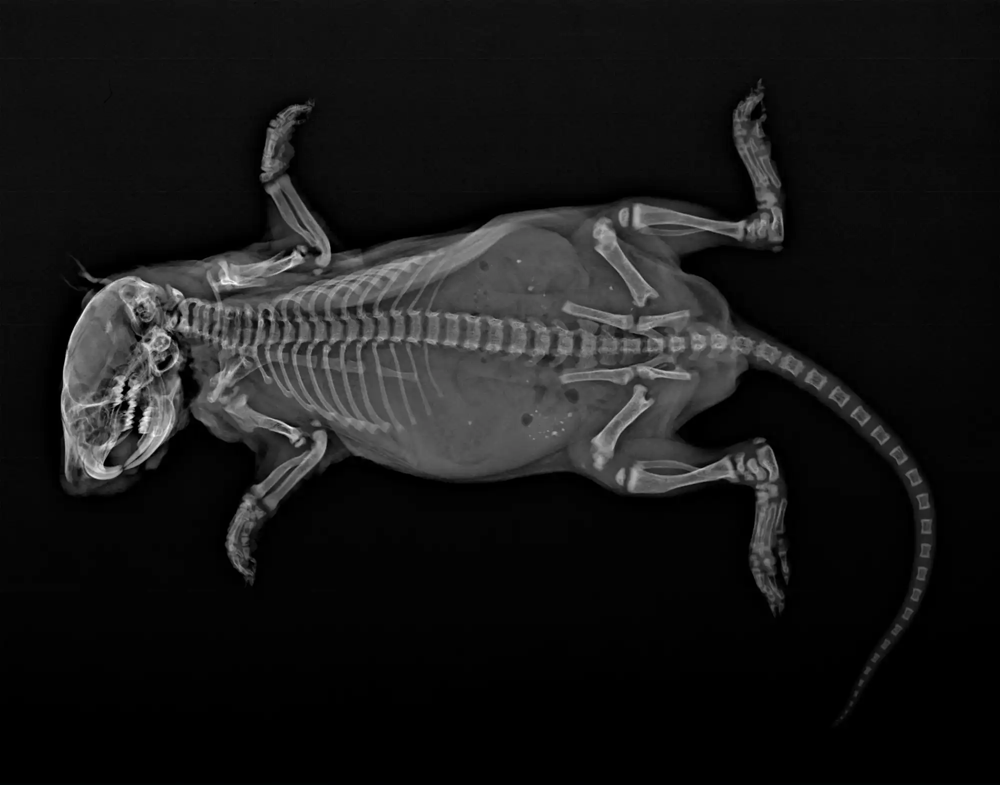

In [162]:
# if input image is in range 0..1, please first multiply img by 255
# assume image is ndarray of shape [height, width, channels] where channels can be 1, 3 or 4
def imshow(img):
    import cv2
    import IPython
    _,ret = cv2.imencode('.png', img) 
    i = IPython.display.Image(data=ret)
    IPython.display.display(i)

imshow(img)

# 2. convert to gray scale and normalize (a)

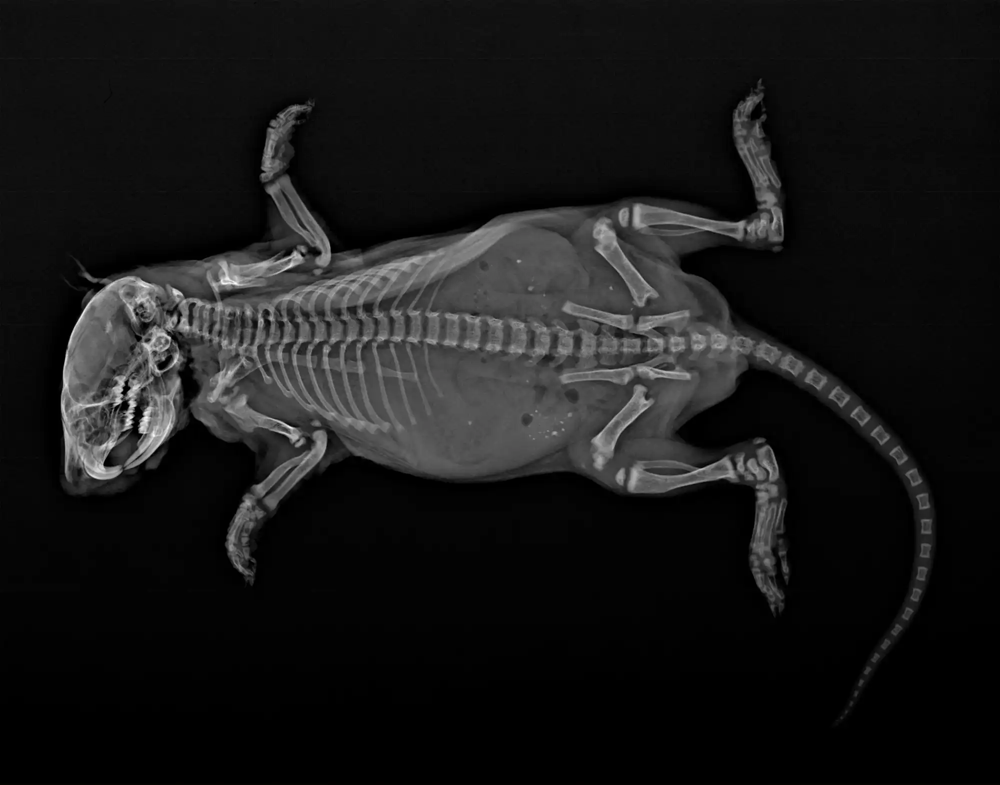

In [140]:
img_normalized = img_rgb.astype(np.float32) / 255.0
imshow(img_normalized*255)

# 3. convolve (a) with laplacian filter (b)

In [126]:
laplacian_filter = np.array([
    [0, -1, 0], 
    [-1, 5, -1], 
    [0, -1, 0]
], dtype=np.float32)


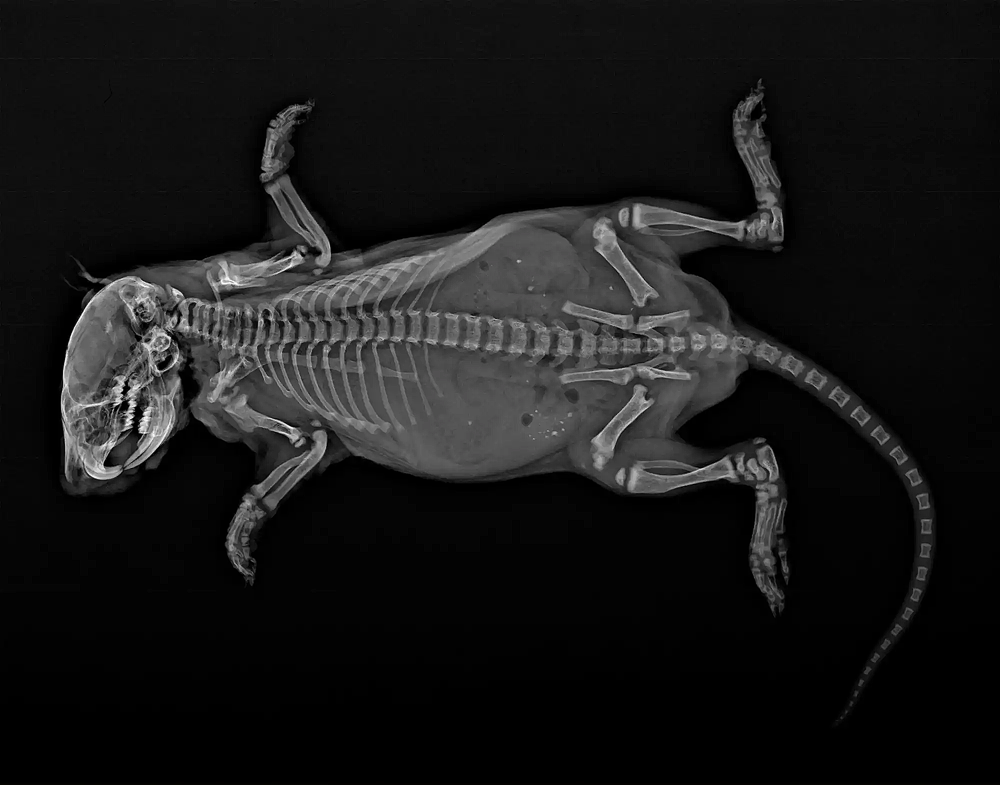

In [131]:
laplacian_img_cv2 = cv2.filter2D(img_normalized, -1, laplacian_filter)

imshow(laplacian_img_cv2*255)

# 4. obtain sharpened image (c) from (a) - (b)

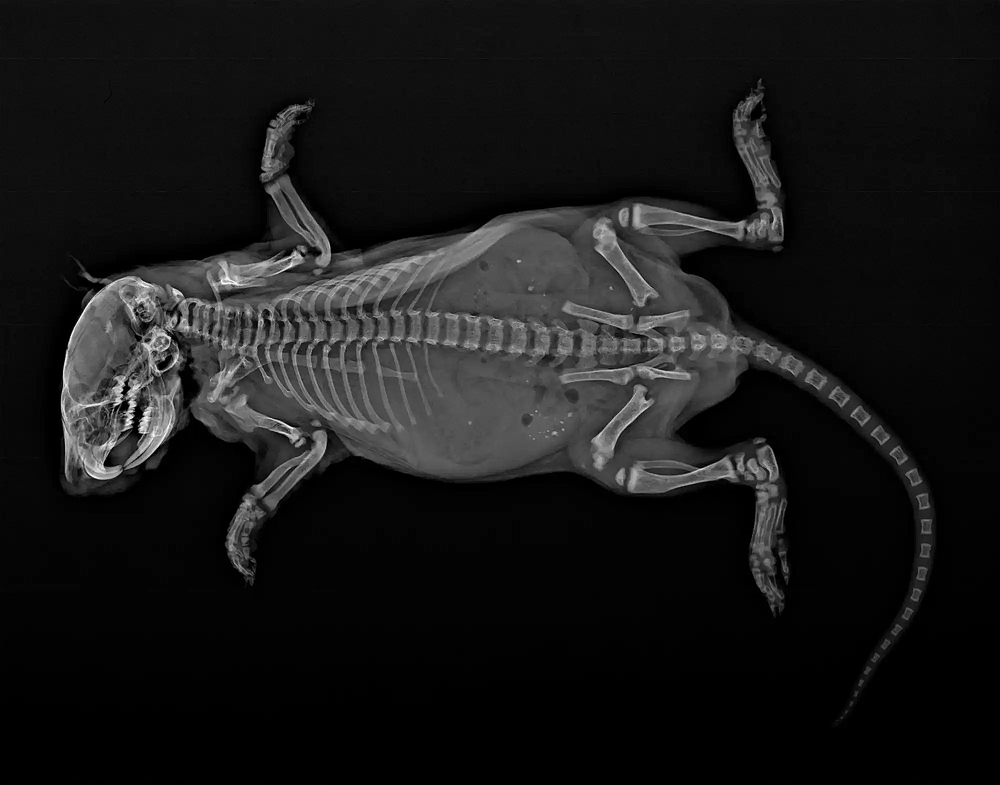

In [134]:
# Laplacian filter of bone scan + sharpened image using the filter

laplacian_img = img_normalized.copy()
w,h,c = img_normalized.shape


for i in range(1,w-1):
    for j in range(1,h-1):
        total = 0
        for k in range(-1,2):
            for l in range(-1,2):
                total += float(img_normalized[i-k, j-l, 0]) * laplacian_filter[k+1][l+1]

        if total > 1.0:
            total = 1.0
        if total < 0:
            total = 0
        
        laplacian_img[i,j] = total

imshow(laplacian_img*255)

# 5. apply sobel filter to (a) and obtain (d)

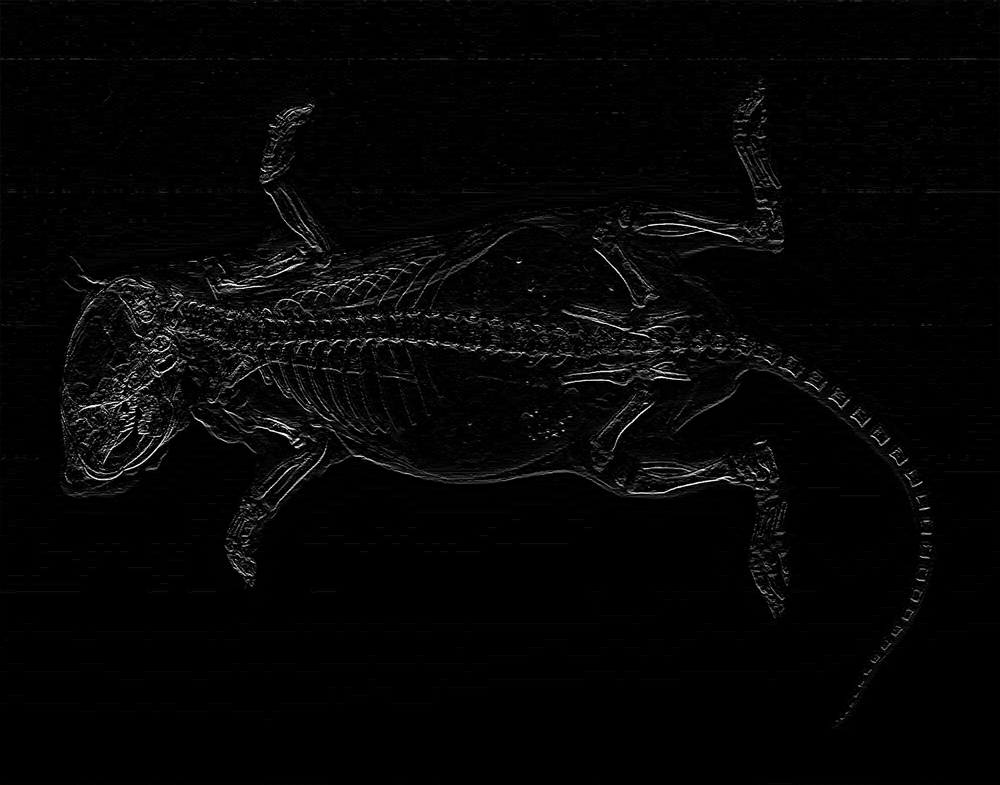

In [149]:
# Sobel filter of bone scan 1
sobel_filter_horizontal = img_normalized.copy()

sobel_1 = np.array([
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1],
], dtype=np.float32)

for i in range(1,w-1):
    for j in range(1,h-1):
        total = 0
        for k in range(-1,2):
            for l in range(-1,2):
                total += float(laplacian_img[i-k, j-l, 0]) * sobel_1[k+1, l+1]

        if total > 1.0:
            total = 1.0
        if total < 0:
            total = 0
        
        sobel_filter_horizontal[i,j] = total

imshow(sobel_filter_horizontal*255)

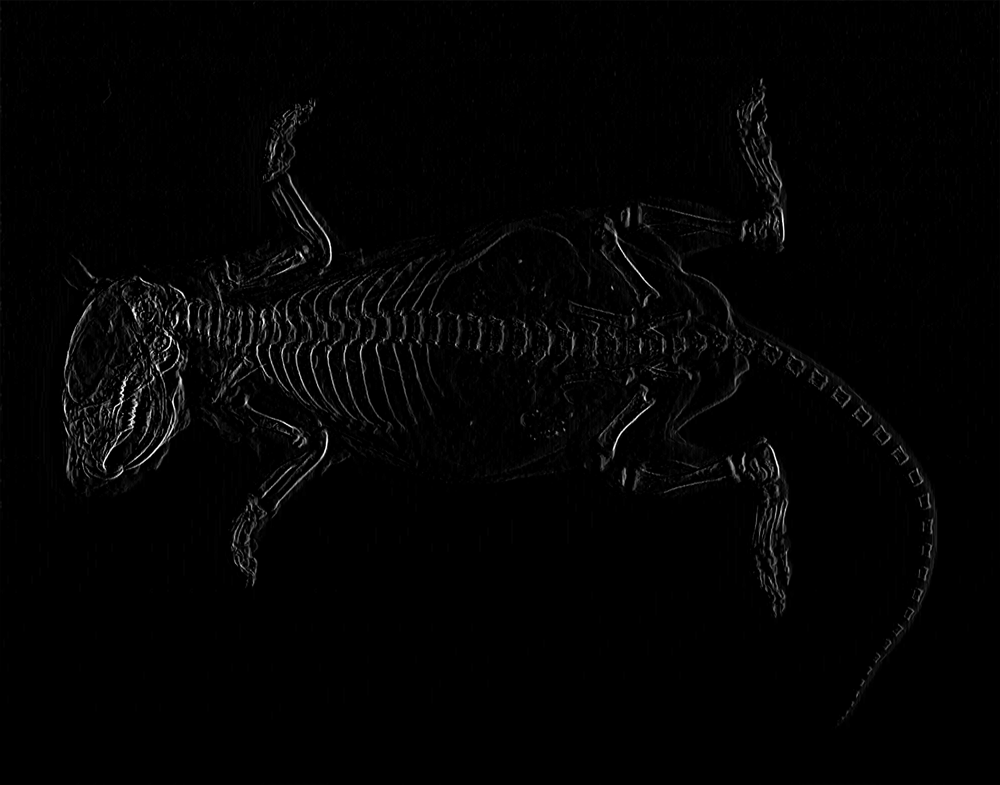

In [150]:
# Sobel filter of bone scan 2
sobel_filter_vertical = laplacian_img.copy()

sobel_2 = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1],
], dtype=np.float32)

for i in range(1,w-1):
    for j in range(1,h-1):
        total = 0
        for k in range(-1,2):
            for l in range(-1,2):
                total += float(img_normalized[i-k, j-l, 0]) * sobel_2[k+1, l+1]

        if total > 1.0:
            total = 1.0
        if total < 0:
            total = 0
        
        sobel_filter_vertical[i,j] = total

imshow(sobel_filter_vertical*255)

# 6. smooths out (d) with 5x5 averaging filter and obtain (e)

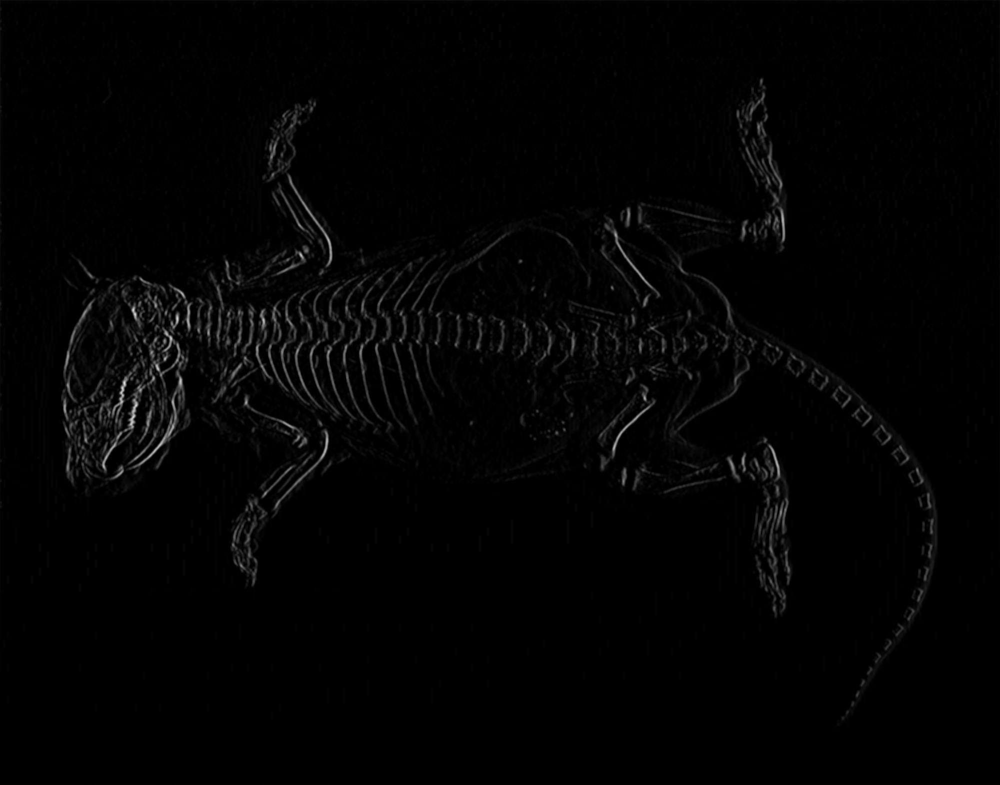

In [153]:
# Smooths out sobel filter image 5x5

smoothed_sobel = sobel_filter_vertical.copy()

for i in range(2, w-2):
    for j in range(2, h-2):
        total = 0
        
        for k in range(-2, 3):
            for l in range(-2,3):
                total += sobel_filter_vertical[i+k, j+l]

        avg_total = total / 25.0

        smoothed_sobel[i,j] = avg_total

imshow(smoothed_sobel*255)

# 7. the product of (c) and (e) used as mask (what does this mean?) obtain (f)

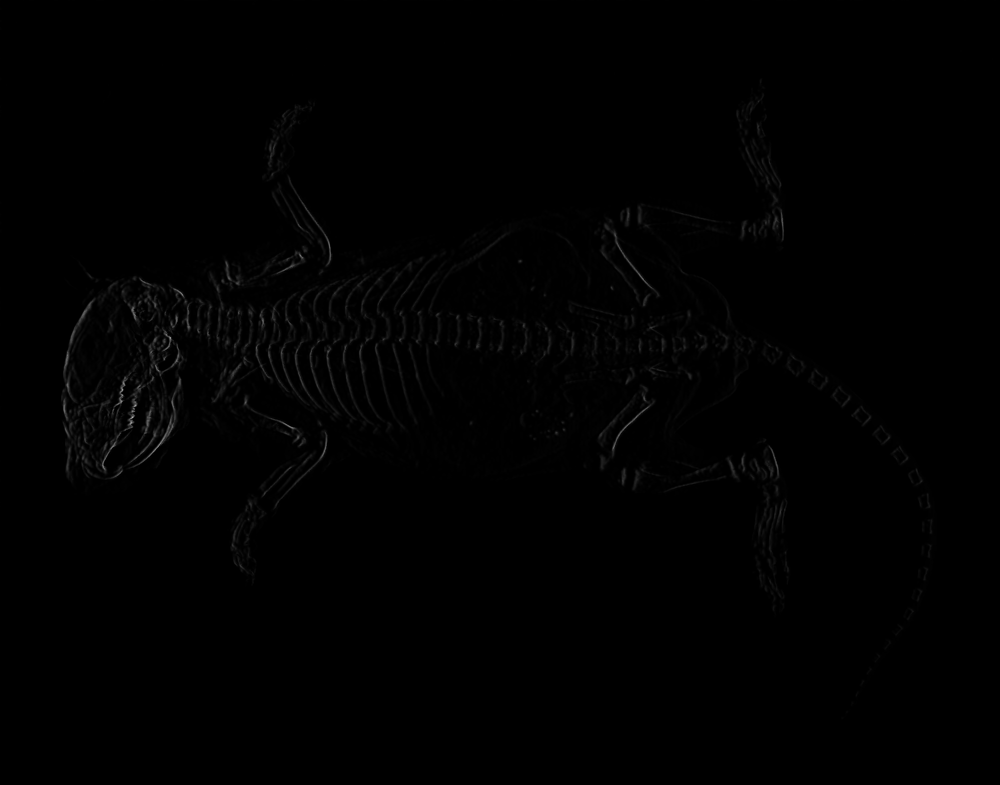

In [158]:
f_mask = smoothed_sobel * laplacian_img

imshow(f_mask*255)

# 8. sum of (a) and (f) gives sharpened image (g)

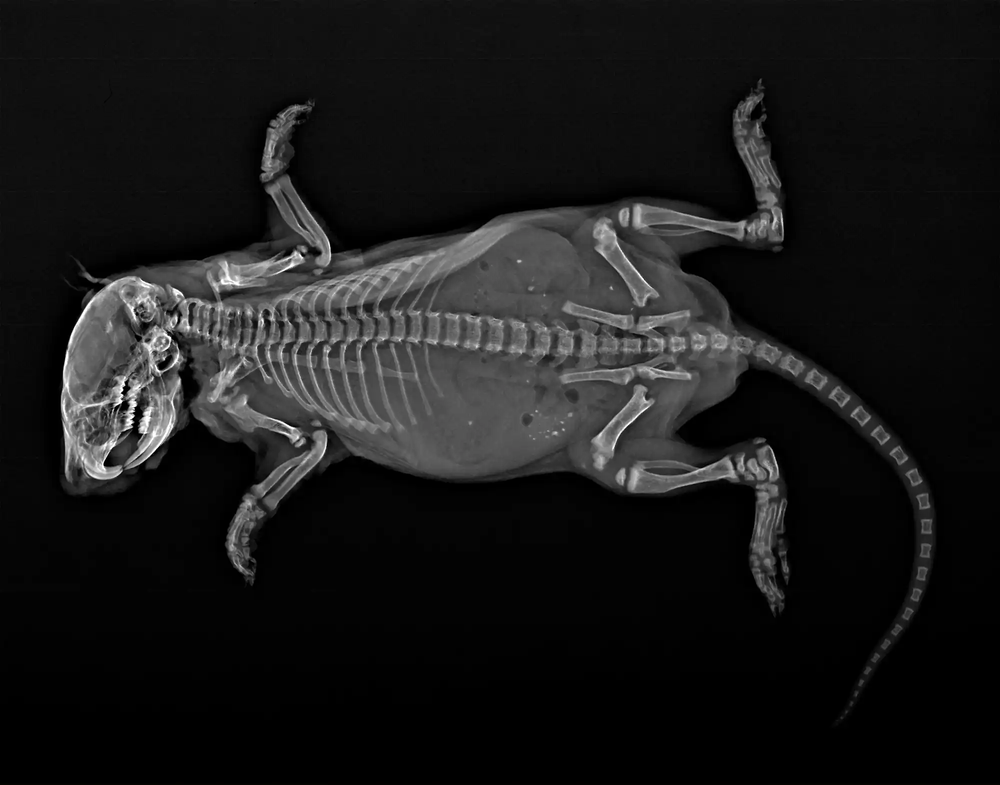

In [159]:
sharper_sum = img_normalized + f_mask

imshow(sharper_sum*255)

# 9. apply power law to (g) and obtain final product (h)

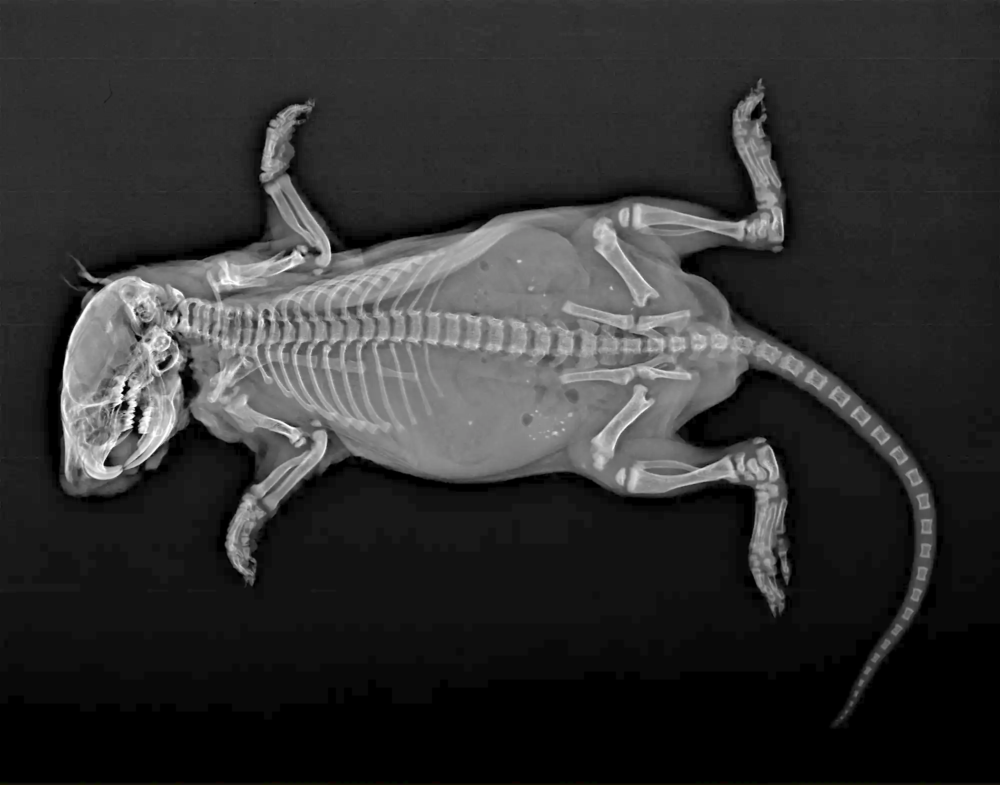

In [161]:
final_power = sharper_sum.copy()

for i in range(w):
    for j in range(h):
        final_power[i,j] = sharper_sum[i,j]**0.6

imshow(final_power*255)